In [1]:
import os
os.environ['OPENBLAS_NUM_THREADS'] = '1'

%matplotlib inline
from copy import deepcopy as copy
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import numpy as np
from scipy import stats
import scipy.io as sio
import pandas as pd
import pickle
from collections import OrderedDict
from scipy.ndimage.interpolation import shift
from functools import reduce
import time
import re
from scipy.special import comb
import time
import asyncio
from bisect import bisect_left

from aux import Generic, bin_occurrences, safe_apply_stat, flatten
from disp import set_font_size, get_spaced_colors, graph_weight_matrix
from ntwk import LIFNtwkG
from utils.general import *
from utils.file_io import *

dt = 0.2e-3

In [2]:
interneuron_blue = 'blue'

In [3]:
def save_fig(fig, path, name):
    if not os.path.exists(path):
        os.makedirs(path)
    fig.savefig(os.path.join(path, name))

In [4]:
def get_equally_spaced_colors(n, cmap='autumn'):
    cmap = plt.get_cmap(cmap)
    colors = cmap(np.linspace(0, 1, n))
    return [matplotlib.colors.rgb2hex(rgba) for rgba in colors]

In [5]:
def process_single_activation(exc_raster, n):
    # extract first spikes
    first_spk_times = np.nan * np.ones(n)
    for i in range(exc_raster.shape[1]):
        nrn_idx = int(exc_raster[1, i])
        if np.isnan(first_spk_times[nrn_idx]):
            first_spk_times[nrn_idx] = exc_raster[0, i]
    return first_spk_times

In [6]:
def load_exp_data(direc, cut=None, layer_size=10, n_exc=1000, new_cell_idx=None, name_frags=[], reverse=False):
    if new_cell_idx is None:
        new_cell_idx = n_exc
        
    file_names = [f for f in sorted(all_files_from_dir(direc))]
    file_names = [f for f in filter_list_by_name_frags(file_names, name_frags)]
    if cut is not None:
        file_names = file_names[:cut]
        
    included_cell_mask = None
    file_name_count = range(0, len(file_names))
    if reverse:
        file_name_count = reversed(file_name_count)
    for i_f in file_name_count:
        file = file_names[i_f]
        
        if i_f == 0:
            loaded = sio.loadmat(os.path.join(direc, file))
        
        def lazy_load():
            loaded = sio.loadmat(os.path.join(direc, file))

            exc_raster = loaded['exc_raster']
            inh_raster = loaded['inh_raster']

            first_spk_times = process_single_activation(loaded['exc_raster'].astype(float), n_exc)

            layers_active = []
            layer_weights = []

            data = {
                'index': i_f,
                'first_spk_times': first_spk_times,
                
                'w_e_e': loaded['w_e_e'][0],
                'w_e_i': loaded['w_e_i'][0],
                'w_i_e': loaded['w_i_e'][0],
                
                'exc_raster': exc_raster,
                'inh_raster': inh_raster,
                'freqs': loaded['freqs'][0],
                'spk_bins': loaded['spk_bins'][0],
                
                'prop_speed': loaded['prop_speed'][0],
                'avg_temporal_width': loaded['avg_temporal_width'][0],
                'stable': loaded['stable'][0],
                
                'exc_raster_unperturbed': exc_raster,
            }
            if 'gs' in loaded:
                data['gs'] = loaded['gs']
                
            if 'w_r_e' in loaded:
                data['w_r_e'] = loaded['w_r_e']
                data['w_r_i'] = loaded['w_r_i']
                
            surviving_cell_mask = None
            if 'surviving_cell_mask' in loaded:
                surviving_cell_mask = loaded['surviving_cell_mask'][0, :].astype(bool)
                data['surviving_cell_mask'] = surviving_cell_mask
                
                sorting_order = np.argsort(exc_raster[1, :])
                exc_raster_sorted = exc_raster[:, sorting_order]
                indices = np.arange(len(surviving_cell_mask))[surviving_cell_mask.astype(bool)]
                
                exc_raster_unperturbed = []
                exc_raster_perturbed = []
                
                j = 0
                for idx in np.arange(exc_raster_sorted.shape[1]):
                    if j >= len(indices):
                        exc_raster_perturbed.append(exc_raster_sorted[:, idx].reshape(2, 1))
                    elif exc_raster_sorted[1, idx] < indices[j]:
                        exc_raster_perturbed.append(exc_raster_sorted[:, idx].reshape(2, 1))
                    elif exc_raster_sorted[1, idx] == indices[j]:
                        exc_raster_unperturbed.append(exc_raster_sorted[:, idx].reshape(2, 1))
                    elif exc_raster_sorted[1, idx] > indices[j]:
                        j += 1
                
                data['exc_raster_unperturbed'] = np.concatenate(exc_raster_unperturbed, axis=1)
                data['exc_raster_perturbed'] = np.concatenate(exc_raster_perturbed, axis=1)
                
            if 'w_r_e' in loaded:
                w_r_e = data['w_r_e']
                
                w_r_e_e = w_r_e[:new_cell_idx, :n_exc]
                w_r_e_i = w_r_e[n_exc:, :n_exc]
                
                if surviving_cell_mask is not None:
                    w_r_e_e_surviving = w_r_e_e[(surviving_cell_mask & (np.arange(n_exc) < new_cell_idx)).astype(bool), :]
                    summed_incoming_weights_e_e = np.sum(w_r_e_e_surviving[:, surviving_cell_mask], axis=1)
                    summed_incoming_weights_e_i = np.sum(w_r_e_i[:, surviving_cell_mask], axis=1)
                else:
                    summed_incoming_weights_e_e = np.sum(w_r_e_e, axis=1)
                    summed_incoming_weights_e_i = np.sum(w_r_e_i, axis=1)
                    
#                 print(np.nonzero(summed_incoming_weights_e_e)[0])
#                 print(np.nonzero(summed_incoming_weights_e_i)[0])
                
                data['mean_incoming_summed_weights_e_e'] = np.mean(summed_incoming_weights_e_e)
                data['std_incoming_summed_weights_e_e'] = np.std(summed_incoming_weights_e_e)
                data['mean_incoming_summed_weights_e_i'] = np.mean(summed_incoming_weights_e_i)
                data['std_incoming_summed_weights_e_i'] = np.std(summed_incoming_weights_e_i)
                
            return data
        yield i_f, lazy_load

In [7]:
def downsample_raster(raster, cell_idxs_to_show):
    j = 0
    if raster.size == 0:
        return np.array([])
    sorted_raster = np.array([y for y in sorted(raster.T, key=lambda x: x[1])]).T
    downsampled = []
    for i in range(sorted_raster.shape[1]):
        while j < len(cell_idxs_to_show) and sorted_raster[1, i] > cell_idxs_to_show[j]:
            j += 1
        if j == len(cell_idxs_to_show):
            break
        if sorted_raster[1, i] == cell_idxs_to_show[j]:
            downsampled.append(sorted_raster[:, i])
    if len(downsampled) > 0:
        return np.stack(downsampled).T
    else:
        return np.array([])

def make_figure_1_sparse(name, cell_range=(0, 900), new_cell_idx=None, per_shown=1., layer_size=10, timepoints=[5, 9, 20], sort_timepoint=300, verify_chain_timepoints=None, color='black', reverse=True):
    if new_cell_idx is None:
        new_cell_idx = cell_range[1]
    
    n_cells = cell_range[1] - cell_range[0]
    
    if type(name) is list:
        all_dirs = filter_list_by_name_frags(all_in_dir('./robustness'), name)
    else:
        all_dirs = filter_list_by_name_frags(all_in_dir('./robustness'), [name])
    
    colors = get_equally_spaced_colors(20, cmap='gist_ncar')
    
    def rendition_label(n):
        if n == 0:
            n = 1
            return f'{n}' + r'$^{st}$ rendition'
        else:
            return f'{n}' + r'$^{th}$ rendition'
        
  
    count = 0
    for d_idx, exp_dir_name in enumerate(sorted(all_dirs)):
        count += 1
        print(exp_dir_name)
        scale = 1.1
        
        fig = plt.figure(constrained_layout=True, figsize=(5 * len(timepoints) * scale, 5 * scale))
        gs = gridspec.GridSpec(ncols=len(timepoints), nrows=3, figure=fig)
        axs = [(fig.add_subplot(gs[:1, i]), fig.add_subplot(gs[1:, i])) for i in range(len(timepoints))]
           
        timepoint_names = [rendition_label(t * 10) for t in timepoints]
        j = len(timepoints) - 1 if reverse else 0
        
        first_first_spk_in_range = None
        last_first_spk_in_range = None
        
        cell_idxs_to_show = None
        cell_idx_names = None
        sorted_order = None

        i = 0
        for i, load_data in load_exp_data(os.path.join('./robustness', exp_dir_name), n_exc=n_cells, name_frags=[], reverse=reverse):
            if i == sort_timepoint:
                data = load_data()
                first_spk_times = data['first_spk_times']
                first_spk_times[np.isnan(first_spk_times)] = first_spk_times.max() + np.arange(np.sum(np.isnan(first_spk_times)))
                firing_idxs = np.arange(len(first_spk_times))
                
                cell_idxs_to_show = firing_idxs[np.logical_and(firing_idxs >= cell_range[0], firing_idxs < cell_range[1])].astype(int)
                shown_first_spk_times = first_spk_times[np.logical_and(firing_idxs >= cell_range[0], firing_idxs < cell_range[1])]        
                
                cell_idx_to_order_map = np.zeros(np.max(cell_idxs_to_show) + 1).astype(int)
                for idx in range(len(cell_idxs_to_show)):
                    cell_idx_to_order_map[cell_idxs_to_show[idx]] = idx
                
                sorted_order = np.nan * np.ones(len(shown_first_spk_times))
                for idx2, k in enumerate(np.argsort(shown_first_spk_times)):
                    sorted_order[k] = idx2
                sorted_order = sorted_order[cell_idx_to_order_map]
            
            if ((j >= 0 and reverse) or (j < len(timepoints) and not reverse)) and i == timepoints[j]:
                data = load_data() if (i != sort_timepoint) else data
                exc_cells_initially_active = data['exc_raster_unperturbed'][:, data['exc_raster_unperturbed'][1, :] < new_cell_idx]
                exc_cells_newly_active = data['exc_raster_unperturbed'][:, data['exc_raster_unperturbed'][1, :] >= new_cell_idx]
                
                exc_cells_initially_active_downsampled = downsample_raster(exc_cells_initially_active, cell_idxs_to_show)
                exc_cells_newly_active_downsampled = downsample_raster(exc_cells_newly_active, cell_idxs_to_show)
                    
                inh_raster = data['inh_raster']
                first_spk_times = data['first_spk_times']
                
                if len(exc_cells_initially_active_downsampled) == 0:
                    continue

                axs[j][1].scatter(exc_cells_initially_active_downsampled[0, :] * 1000, sorted_order[exc_cells_initially_active_downsampled[1, :].astype(int)], s=10, c='black', zorder=0, alpha=1, marker='|')
                if exc_cells_newly_active_downsampled.size > 0:
                    axs[j][1].scatter(exc_cells_newly_active_downsampled[0, :] * 1000, sorted_order[exc_cells_newly_active_downsampled[1, :].astype(int)], s=10, c='#40db57', zorder=0, alpha=1, marker='|')
                    
                    
                if len(inh_raster) > 0:
                    axs[j][0].scatter(inh_raster[0, :] * 1000, inh_raster[1, :] - n_cells, s=10, c=interneuron_blue, zorder=0, alpha=1, marker='|')
                axs[j][1].set_ylim(0, n_cells)
                axs[j][0].set_ylim(0, 200)
                axs[j][0].set_ylabel('Inhibitory\ncell Index')
                axs[j][1].set_ylabel('Excitatory\ncell Index')
                axs[j][1].set_xlabel('Time (ms)')
                axs[j][0].title.set_text(f'{timepoint_names[j]}')
            
                axs[j][0].spines['bottom'].set_visible(False)
                axs[j][1].spines['top'].set_visible(False)
                axs[j][0].tick_params(bottom=False, labelbottom=False)
                
                for row_idx in range(2):
                    # axs[j][row_idx].set_xlim((first_first_spk_in_range - 0.001) * 1000, (last_first_spk_in_range + 0.001) * 1000)
                    axs[j][row_idx].set_xlim(0.05 * 1000, 0.225 * 1000)
                    set_font_size(axs[j][row_idx], 16)
                    axs[j][row_idx].spines['right'].set_visible(False)
                    axs[j][row_idx].set_ylim(6)
                if reverse:
                    j -= 1
                else:
                    j += 1
        
#         fig.tight_layout()  
#         save_fig(fig, './figures/paper/rasters', f'{exp_dir_name}.svg')

stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2000_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:5704
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2001_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:1671
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2002_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:6544
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2003_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:4922
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2004_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:5876
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2005_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:1805
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2006_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:2415
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2007_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:6435


/gscratch/stf/davidgbe/compneuro/davidgbe-env/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  fig.canvas.print_figure(bytes_io, **kw)


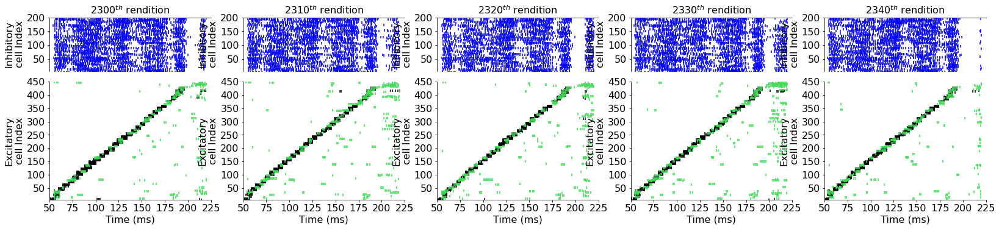

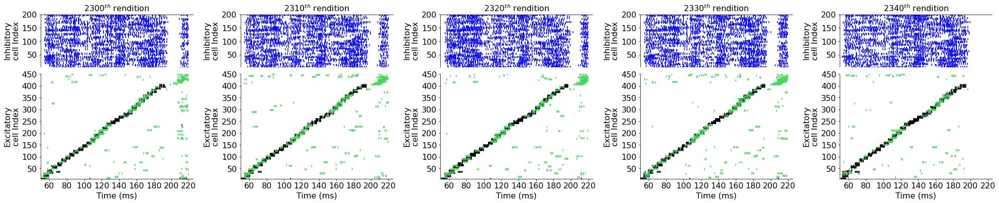

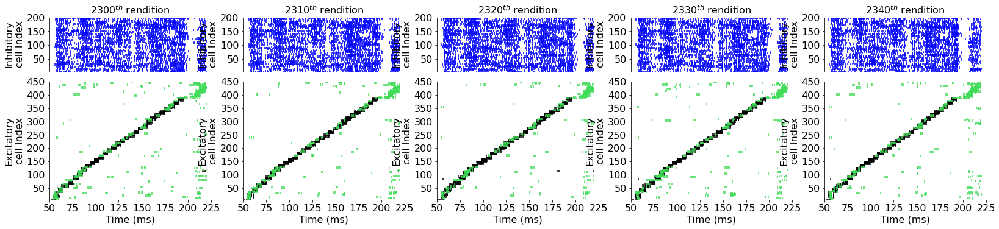

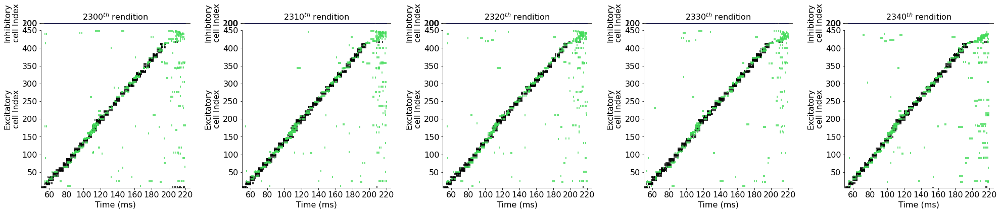

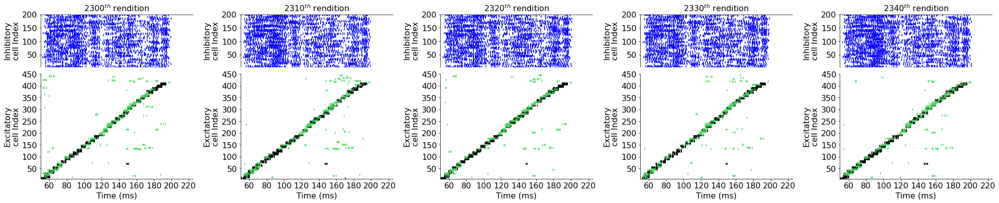

...

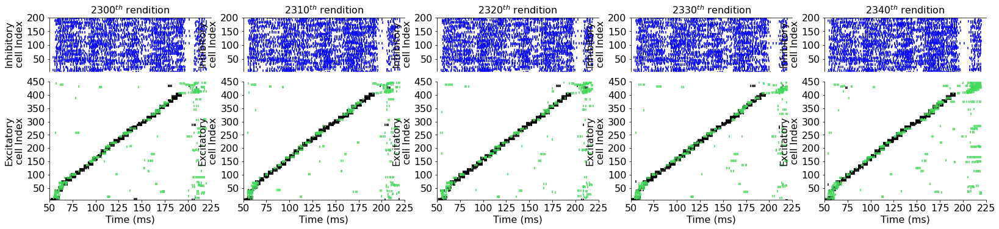

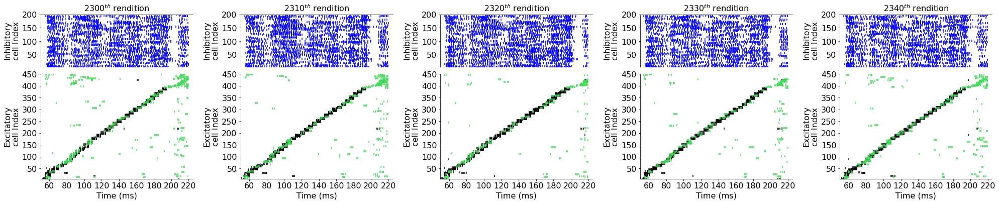

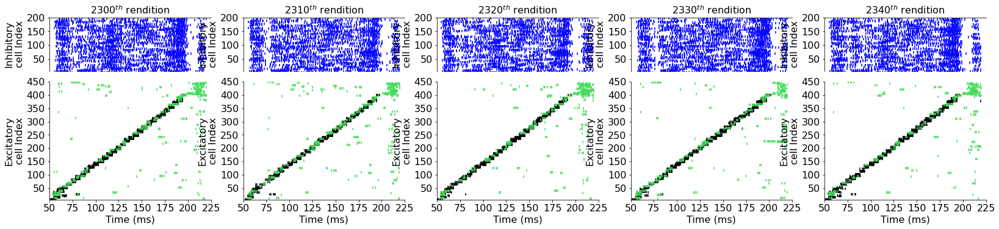

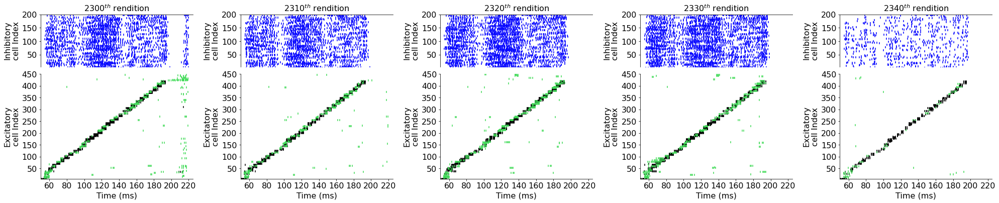

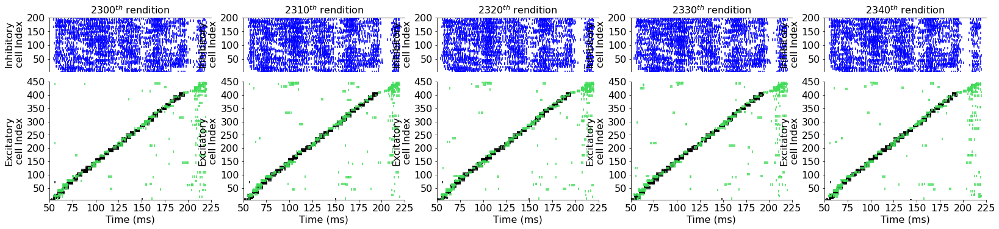

In [19]:
make_figure_1_sparse(
    ['stdp_rand_syn_slow_7', 'CONDITION_all'],
    cell_range=(0, 450),
    new_cell_idx=300,
    timepoints=np.arange(230, 235),
    sort_timepoint=240,
    per_shown=1.,
    color='#c41f3b',
    reverse=True
)

stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2000_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:5704
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2001_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:1671
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2002_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:6544
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2003_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:4922
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2004_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:5876
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2005_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:1805
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2006_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:2415
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2007_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:6435


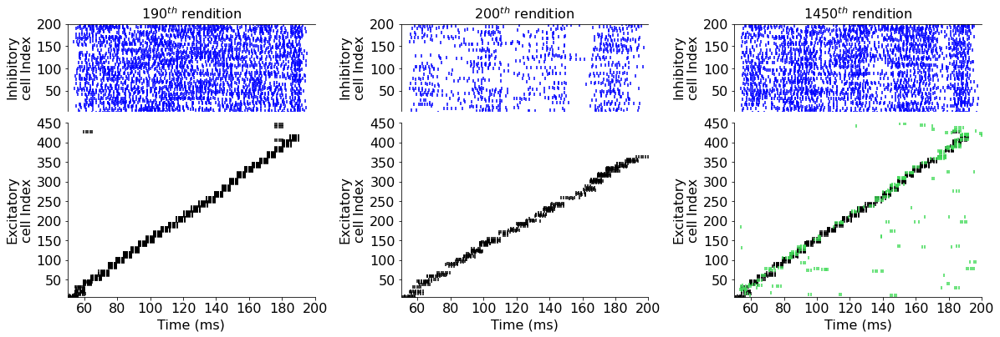

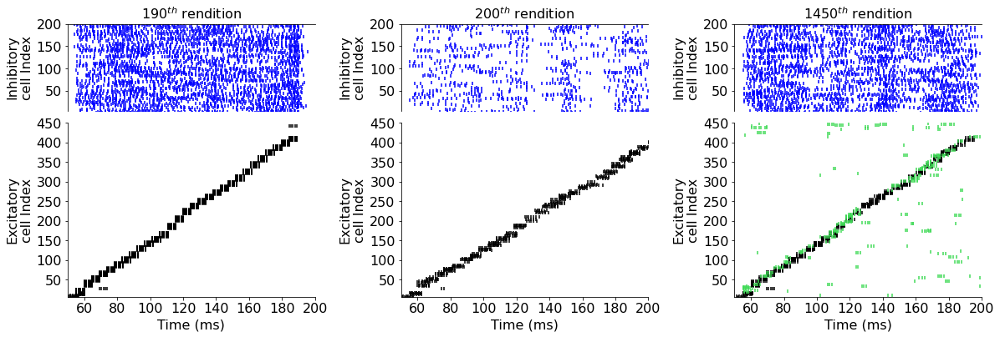

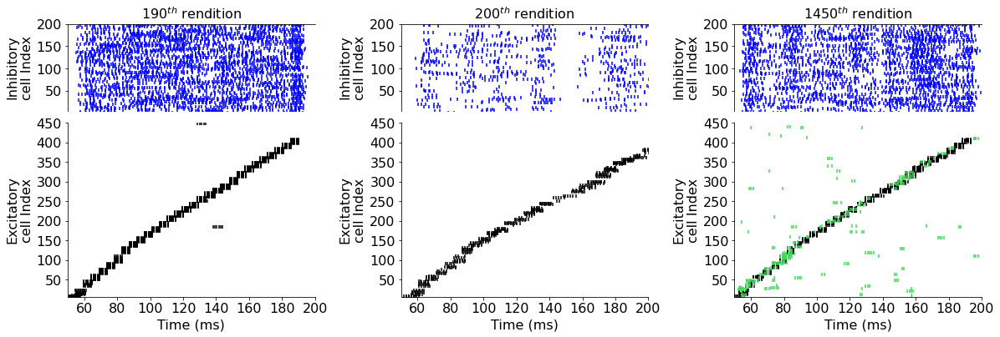

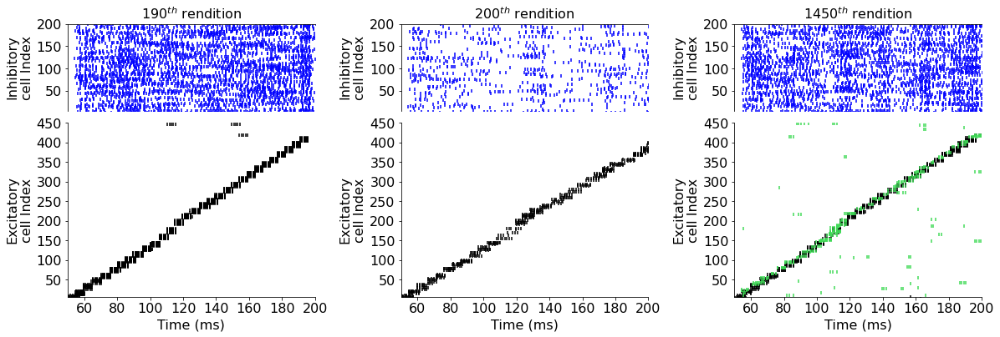

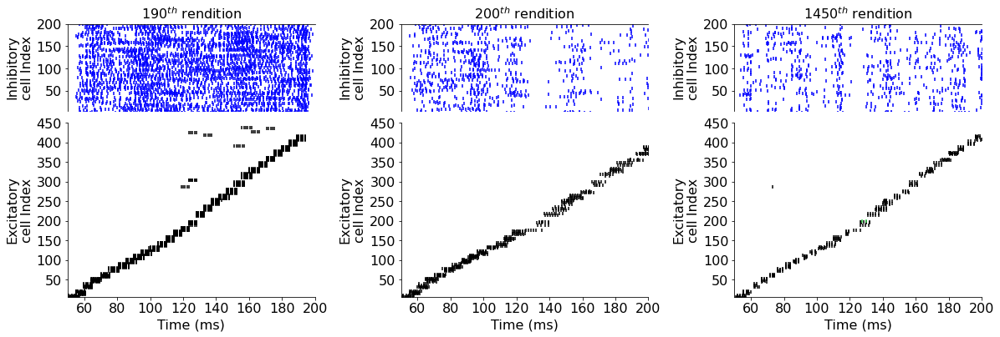

...

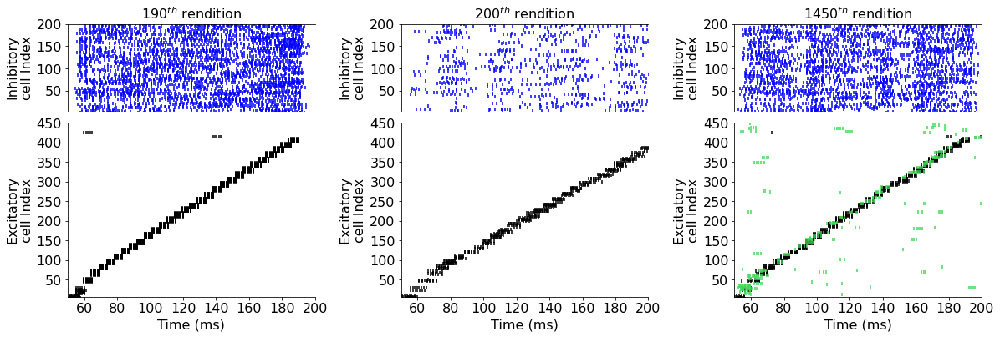

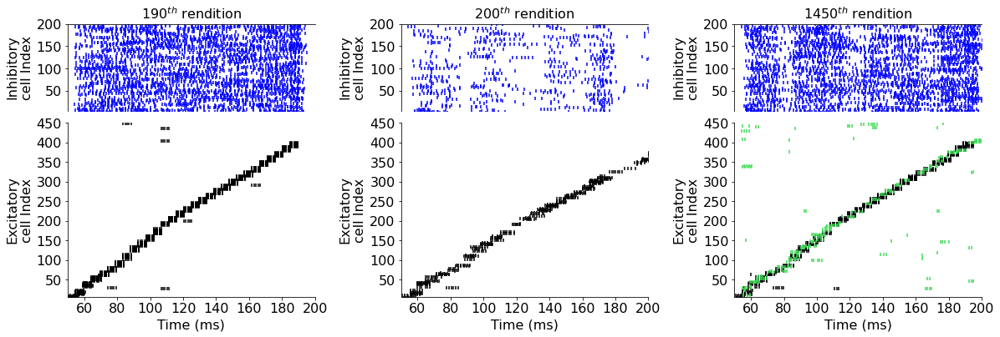

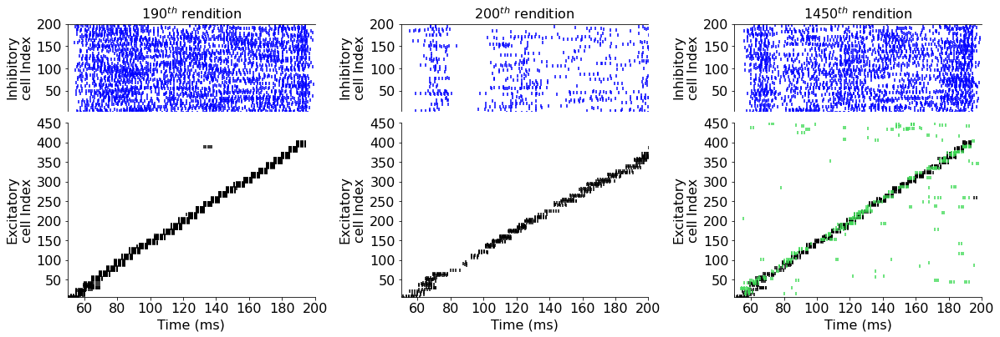

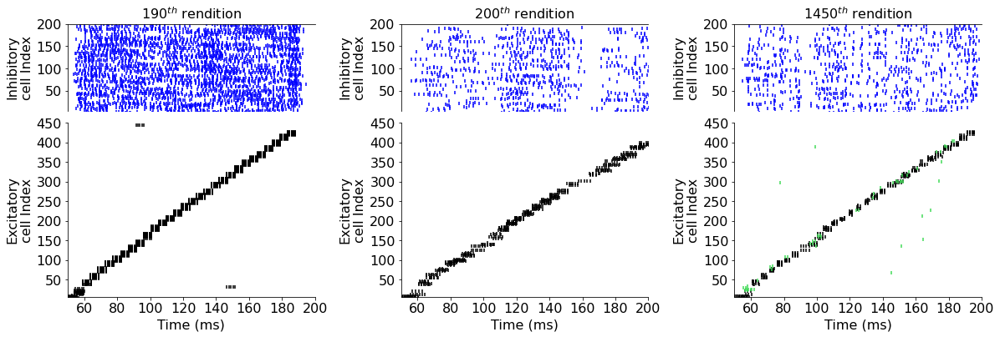

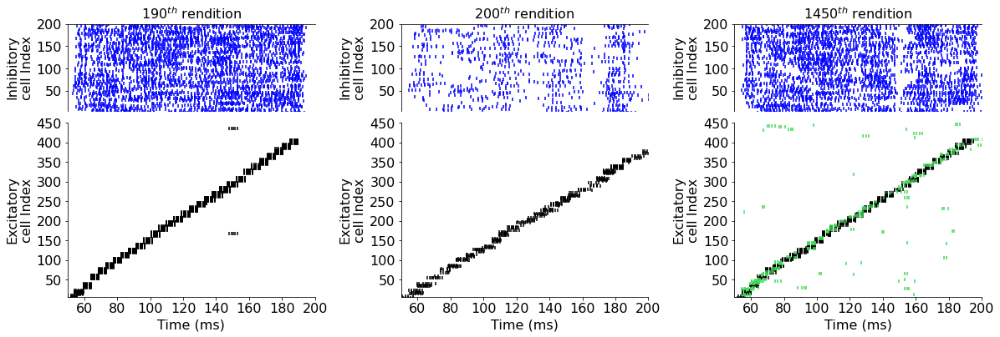

In [73]:
make_figure_1_sparse(
    ['stdp_rand_syn_slow_7', 'CONDITION_all'],
    cell_range=(0, 450),
    new_cell_idx=300,
    timepoints=[19, 20, 145],
    sort_timepoint=150,
    per_shown=1.,
    color='#c41f3b',
    reverse=True
)

stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2000_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_no_syn_2022-05-03--03:21--36:5704
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2001_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_no_syn_2022-05-03--03:21--36:1671
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2002_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_no_syn_2022-05-03--03:21--36:6544
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2003_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_no_syn_2022-05-03--03:21--36:4922
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2004_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_no_syn_2022-05-03--03:21--36:5876
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2005_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_no_syn_2022-05-03--03:21--36:1805
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2006_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_no_syn_2022-05-03--03:21--36:2415
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2007_W_I

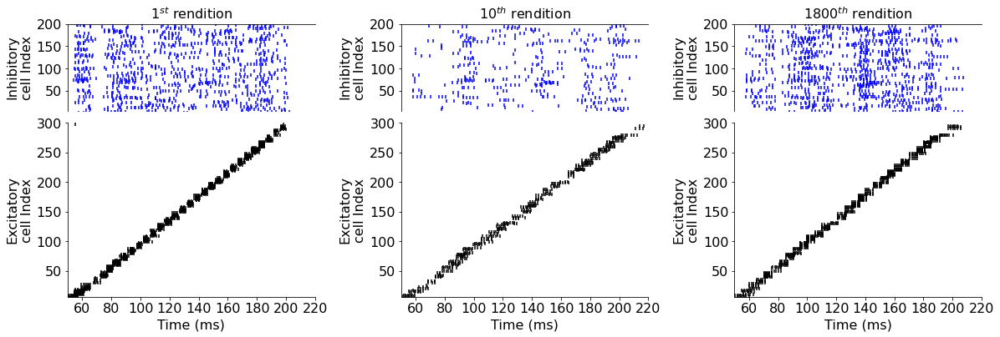

/gscratch/stf/davidgbe/compneuro/davidgbe-env/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: constrained_layout not applied.  At least one axes collapsed to zero width or height.
  fig.canvas.print_figure(bytes_io, **kw)


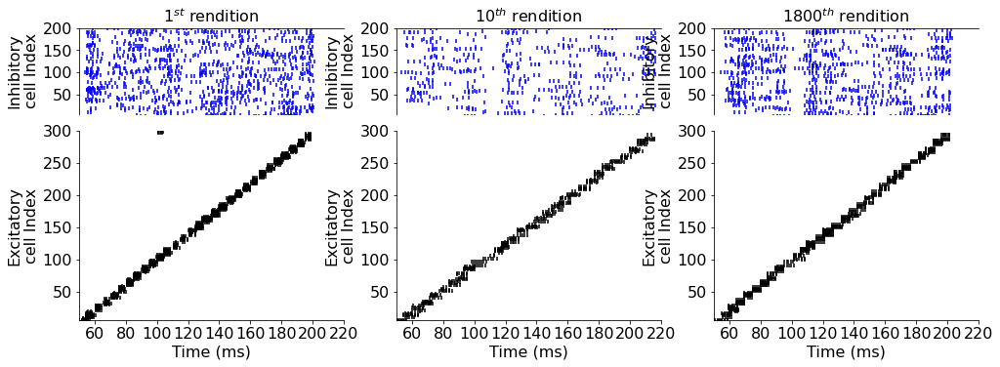

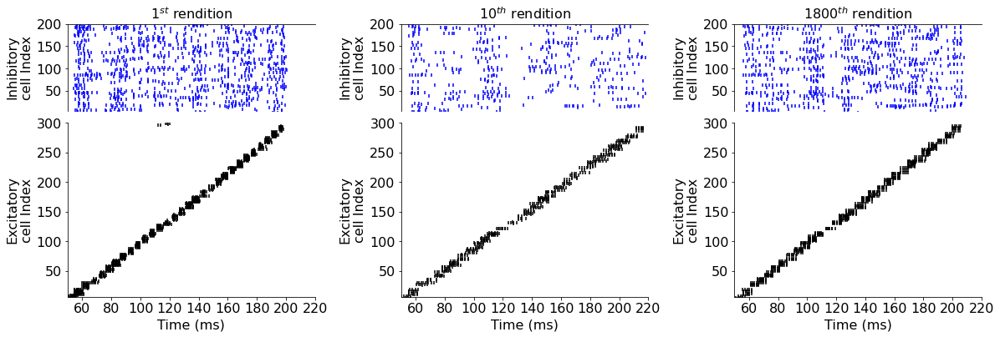

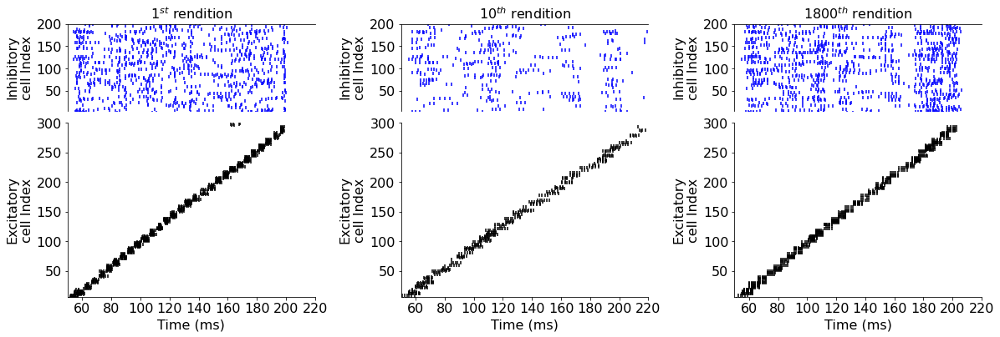

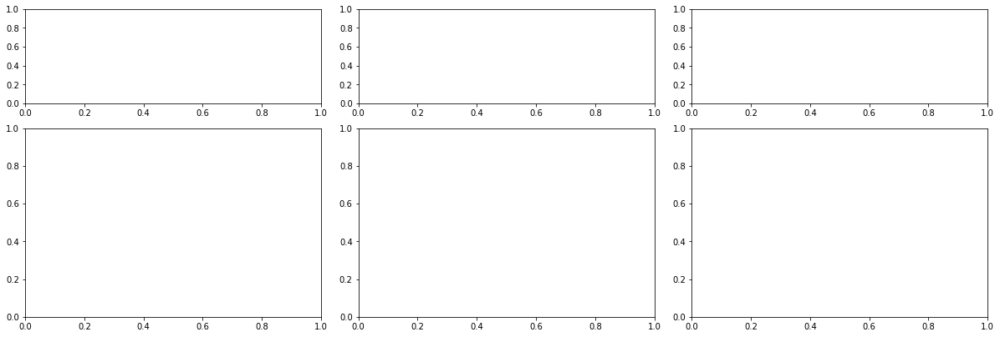

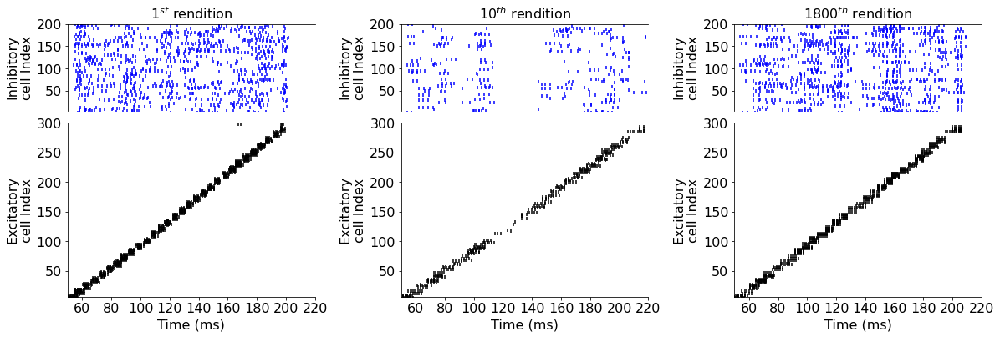

...

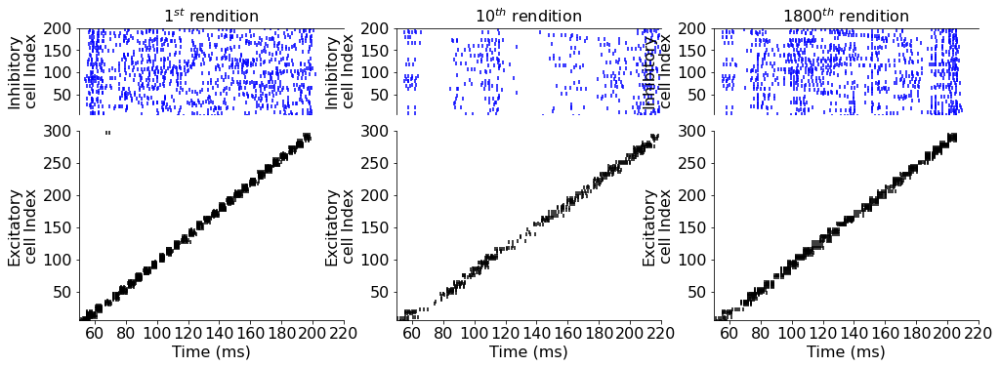

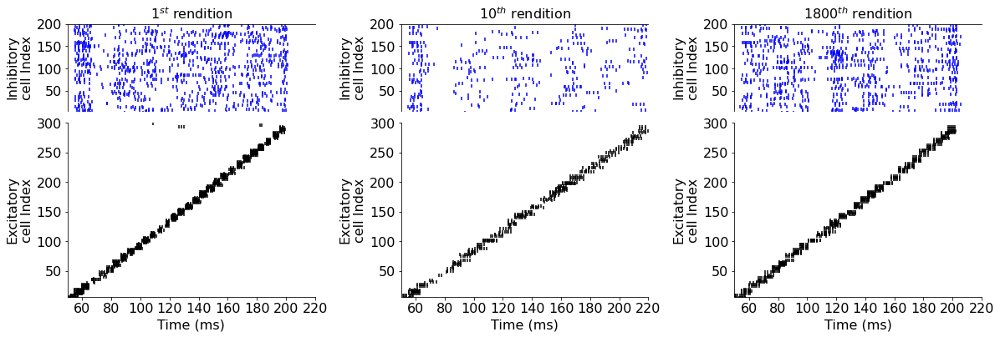

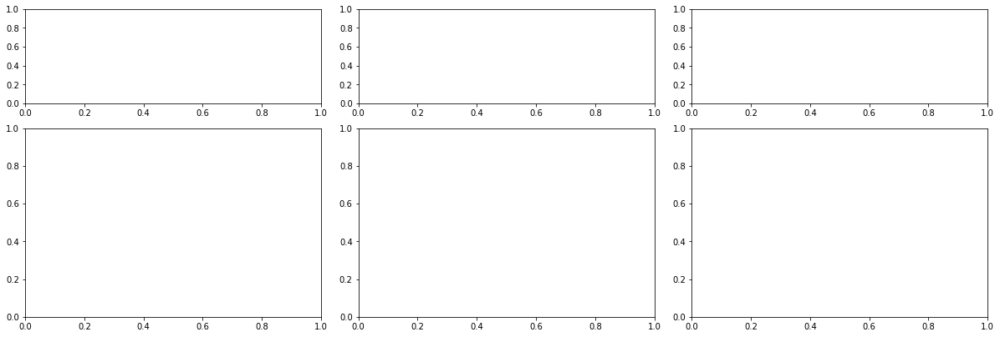

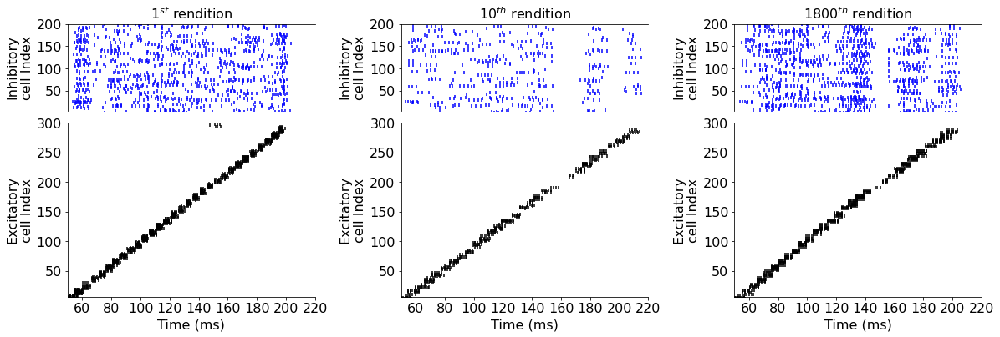

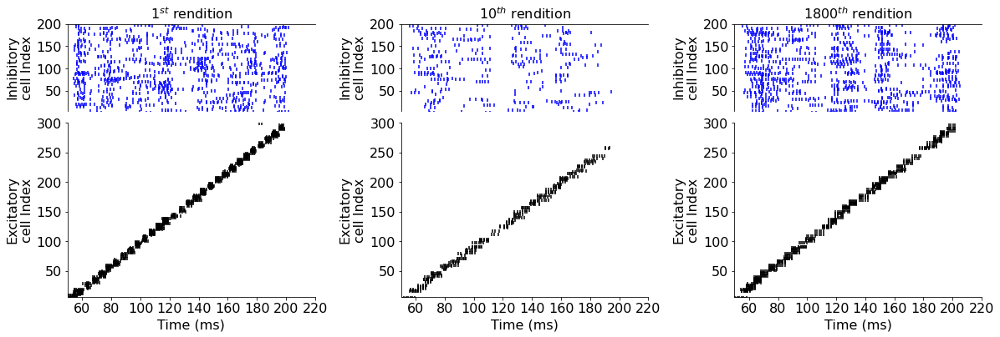

In [103]:
make_figure_1_sparse(
    ['stdp_rand_syn', 'CONDITION_no_repl_no_syn'],
    cell_range=(0, 300),
    timepoints=[0, 1, 180],
    sort_timepoint=190,
    per_shown=1.,
    color='#c41f3b',
    reverse=True
)

In [36]:
def sliding_window_activity(raster, window_size, dt, interval):
    window_size_discrete = int(window_size / dt)
    all_spk_times = np.sort(raster[0, :])
    all_t = np.arange(interval[0], interval[1], dt)
    activity = np.zeros(all_t.shape)
    
    for i_t, t in enumerate(all_t):
        window_start = bisect_left(all_spk_times, t - window_size)
        window_end = bisect_left(all_spk_times, t + window_size)
        activity[i_t] = len(all_spk_times[window_start:window_end])
    return all_t, activity

def make_total_activity_graphs(name, timepoints=[0, 72, 73], n_exc=450, new_cell_idx=None):
    if new_cell_idx is None:
        new_cell_idx = n_exc
    
    if type(name) is list:
        all_dirs = filter_list_by_name_frags(all_in_dir('./robustness'), name)
    else:
        all_dirs = filter_list_by_name_frags(all_in_dir('./robustness'), [name])
                                             
    coeffs = []
    for d_idx, exp_dir_name in enumerate(sorted(all_dirs)):
        scale = 1.1
        
        fig = plt.figure(constrained_layout=True, figsize=(7 * len(timepoints) * scale, 5 * scale))
        gs = gridspec.GridSpec(ncols=len(timepoints), nrows=2, figure=fig)
        axs = [fig.add_subplot(gs[:, i]) for i in range(len(timepoints))]
           
        j = len(timepoints) - 1
        
        recovered_e_activity = None
    

        for i, load_data in load_exp_data(os.path.join('./robustness', exp_dir_name), reverse=True, n_exc=n_exc):
            if j >= 0 and i == timepoints[j]:
#                 print(j, timepoints[j])
                data = load_data()
                if 'exc_raster_unperturbed' in data:
                    exc_raster = data['exc_raster_unperturbed']
                else:
                    exc_raster = data['exc_raster']
                
                exc_raster_old = exc_raster[:, exc_raster[1, :] < new_cell_idx]
                exc_raster_new = exc_raster[:, exc_raster[1, :] >= new_cell_idx]
                    
                inh_raster = data['inh_raster']
                
                t, e_old_activity_trace = sliding_window_activity(exc_raster_old, 3e-3, dt, (0.05, 0.2))
                t, e_new_activity_trace = sliding_window_activity(exc_raster_new, 3e-3, dt, (0.05, 0.2))
                t, i_activity_trace = sliding_window_activity(inh_raster, 3e-3, dt, (0.05, 0.2))
                
                if j == (len(timepoints) - 1):
                    # axs[len(timepoints)].plot(t, e_new_activity_trace - np.nanmean(e_new_activity_trace), lw=0.7, c='green', zorder=0, alpha=1)
#                     axs[len(timepoints)].plot(t, e_old_activity_trace, lw=0.7, c='black', zorder=0, alpha=1)
                    coeffs.append(stats.spearmanr(e_old_activity_trace, e_new_activity_trace).correlation)
#                 if j == 1:
# #                     axs[len(timepoints)].plot(t, e_old_activity_trace - np.nanmean(e_old_activity_trace), lw=0.7, c='black', zorder=0, alpha=1)
# #                     axs[len(timepoints) + 1].scatter(recovered_e_activity, e_old_activity_trace, s=2, c='black', zorder=0, alpha=1)
#                     coeffs.append(stats.spearmanr(e_old_activity_trace, recovered_e_activity).correlation)
                    
                axs[j].plot(t * 1000, e_old_activity_trace, lw=0.7, c='black', zorder=0, alpha=1)
                axs[j].plot(t * 1000, e_new_activity_trace, lw=0.7, c='green', zorder=0, alpha=1)
#                 axs[j].plot(t * 1000, e_old_activity_trace + e_new_activity_trace, lw=0.7, c='purple', zorder=0, alpha=1)
#                 axs[j].plot(t * 1000, i_activity_trace, lw=0.7, c='red', zorder=0, alpha=1)
#                 axs[j].plot(t, i_activity_trace / e_activity_trace * 10, lw=0.7, c='blue', zorder=0, alpha=1)
                j -= 1
    
        for k in range(len(timepoints)):
#                 axs[k].set_ylim(0, 200)
                axs[k].set_xlim(0.05 * 1000, 0.2 * 1000)
                axs[k].set_ylabel('Population spike rate')
                axs[k].spines['right'].set_visible(False)
                axs[k].spines['top'].set_visible(False)
                set_font_size(axs[k], 16)
#         fig.tight_layout()  
        save_fig(fig, './figures/paper/rasters', f'{exp_dir_name}.svg')
    print(coeffs)
    print(np.mean(coeffs), 1.96 * np.std(coeffs) / np.sqrt(17))

[0.11266157727308665, -0.5253350878441212, 0.20298696877048344, -0.13959422371382765, -0.6560233359717065, -0.0810428089276291, 0.3145896571975091, -0.11784068553528523, 7.026011318476047e-05, -0.1489327700030875, 0.06293152780887667, -0.48487557628043376, 0.22064630538342614, -0.04756736769975727, 0.2114722680788934, 0.06263788686635308, 0.2893265029232381, 0.0461523208139046, 0.38389557720113426, 0.19028554625466887]
-0.00517777286455445 0.13143235092465905


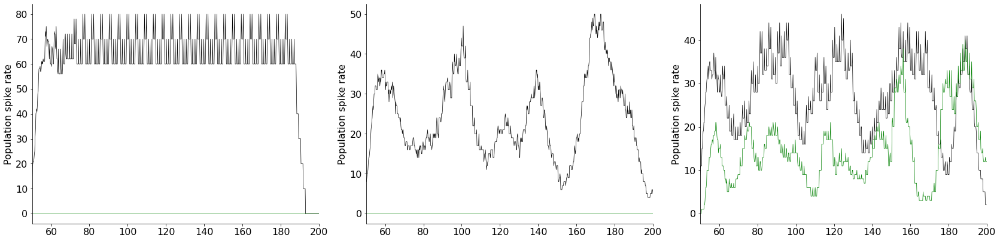

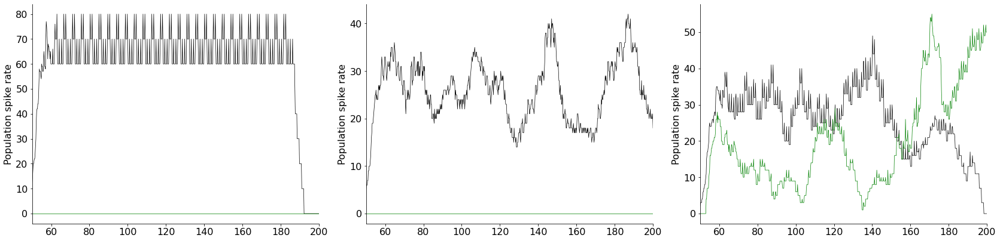

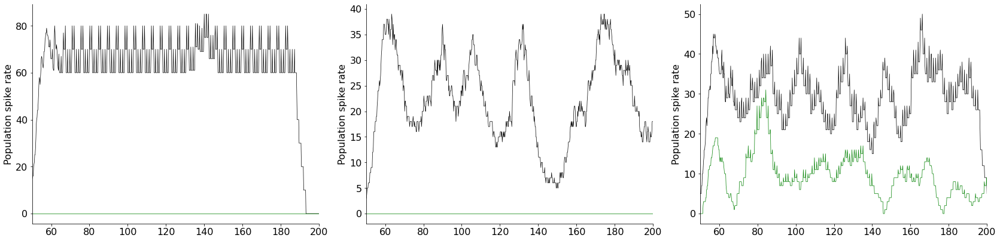

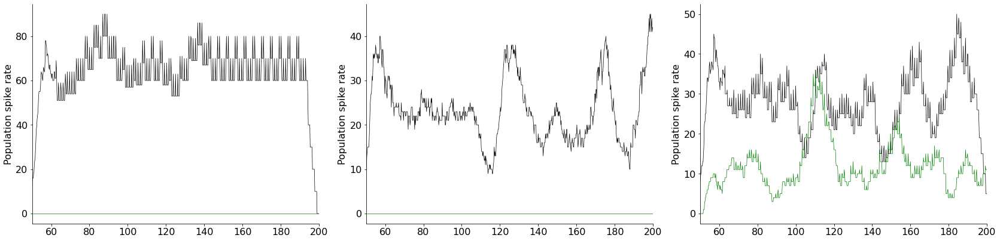

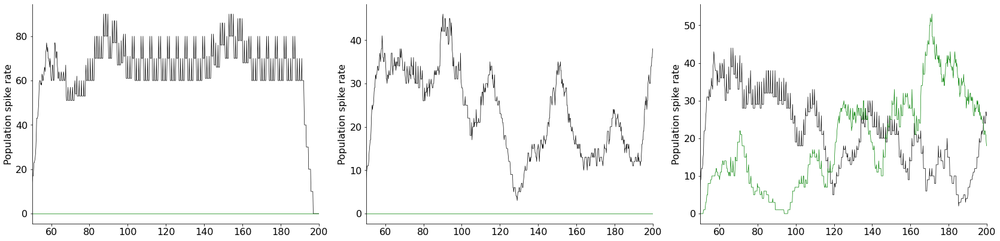

...

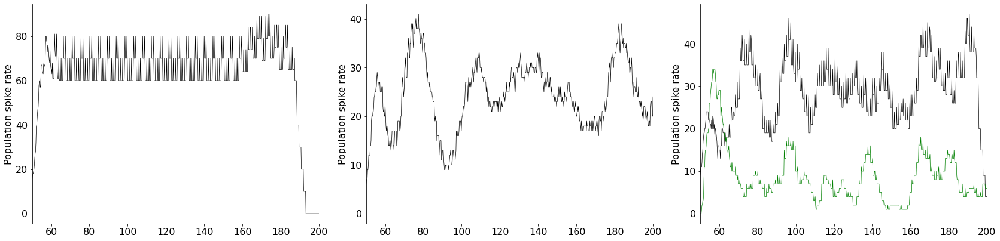

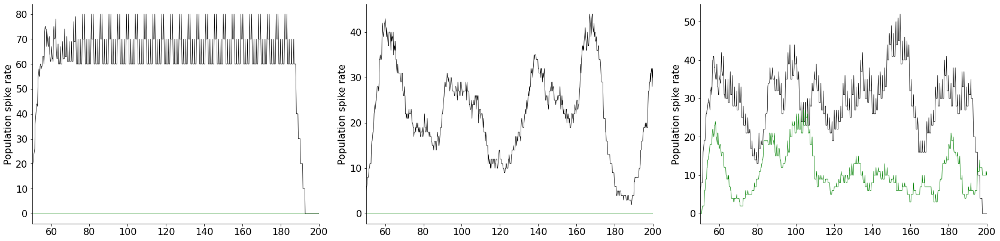

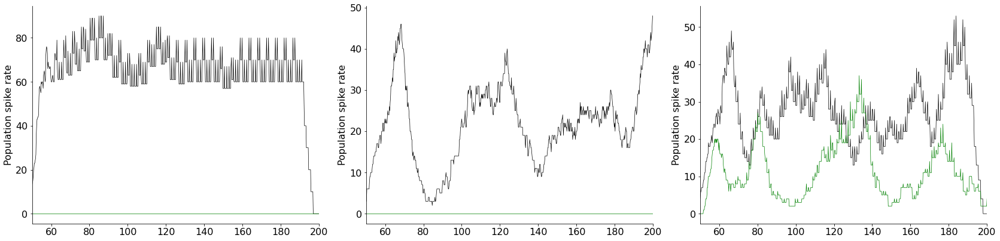

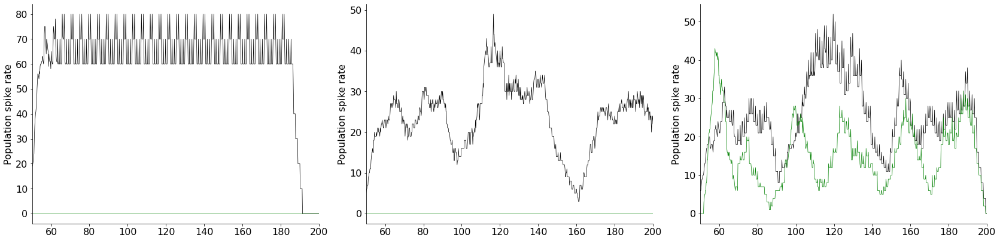

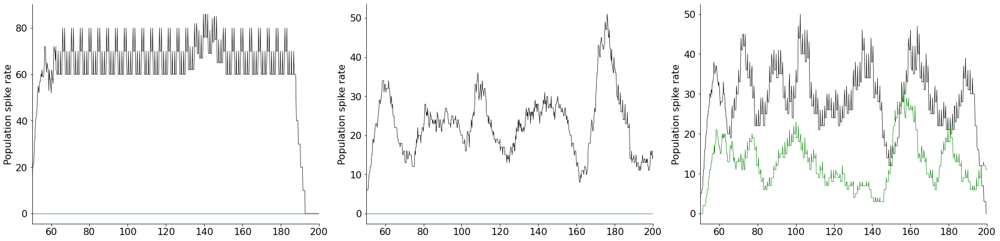

In [37]:
make_total_activity_graphs(['stdp_rand_syn_slow_7', 'CONDITION_all'],
                           timepoints=[19, 20, 90], n_exc=450, new_cell_idx=300)

[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]
nan nan


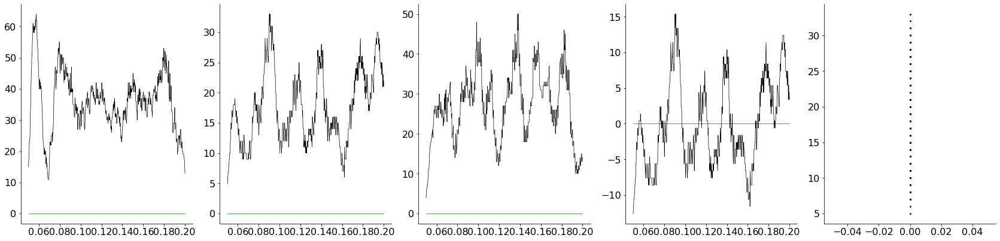

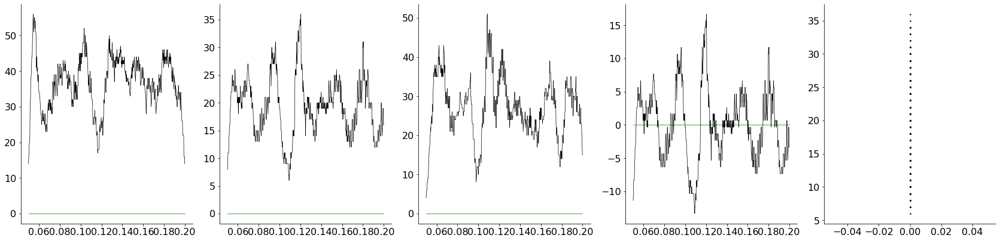

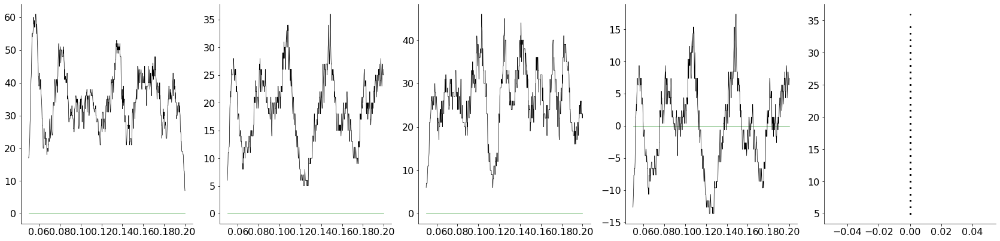

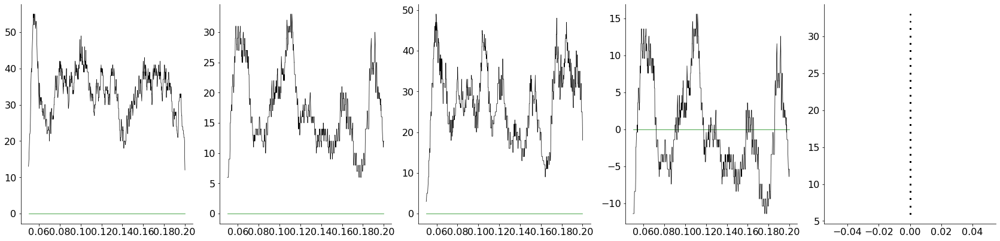

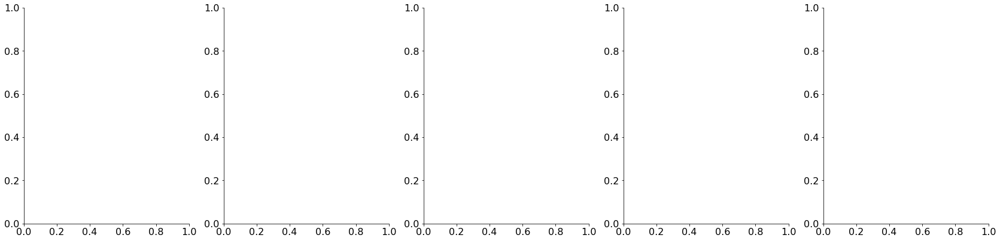

...

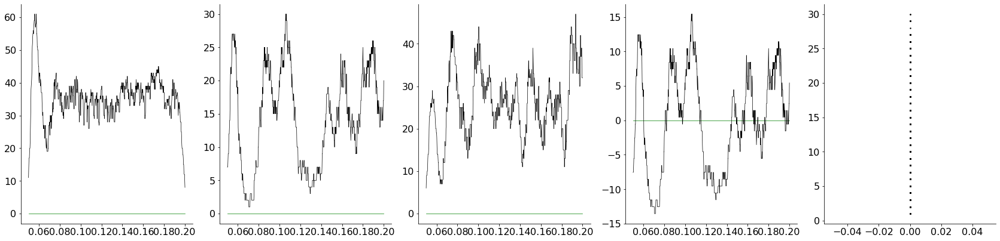

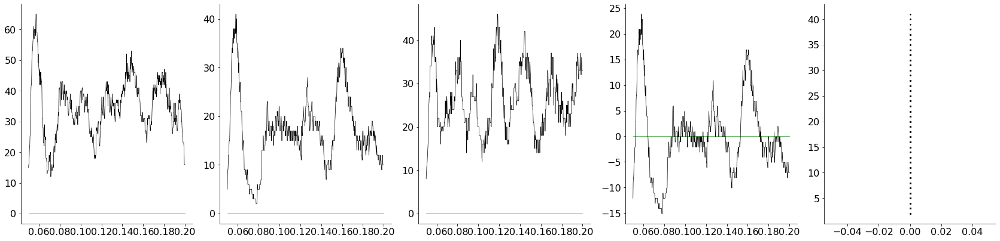

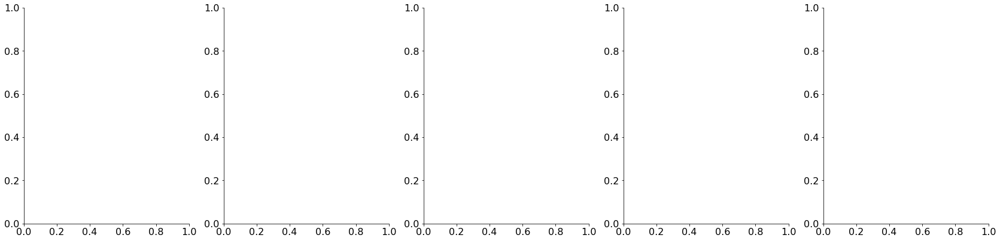

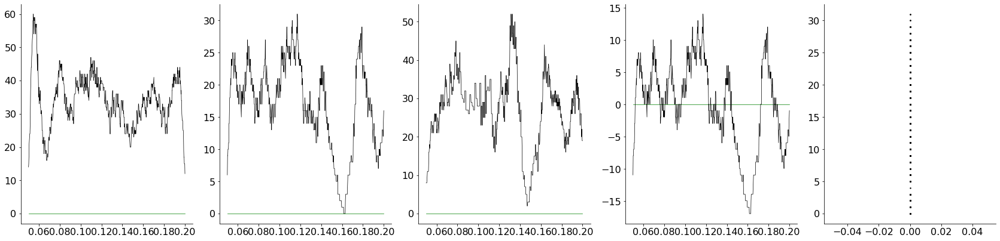

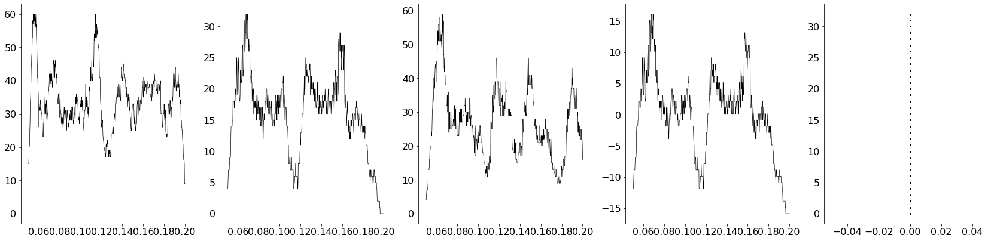

In [65]:
make_total_activity_graphs(['stdp_rand_syn', 'CONDITION_no_repl_no_syn'],
                           timepoints=[0, 1, 180], n_exc=300)

In [16]:
def make_figure_2_plot(names, labels, condition_colors, n_exc=450, new_cell_idx=None, file_name_ext='', ylim1=None, ylim2=None,
                       ylabel1=None, ylabel2=None, timepoints=[], offsets=[], vertical_spacing=0.,
                       axs=None, fig=None, tick_right=True, legend=True):
    scale = 2.5
    
    if fig is None:
        fig, axs = plt.subplots(1, 2, sharex=True, sharey=False, figsize=(6 * scale, 2.5 * scale))
    
    all_dirs = []
    for name in names:
        if type(name) is not list:
            name = [name]
        print(name)
        all_dirs.append([dirs for dirs in filter_list_by_name_frags(all_in_dir('./robustness'), name)])
        
    timepoints = np.array(timepoints)
        
    for idx, exp_dir_names in enumerate(all_dirs):
        all_weights_for_dir_name = []
        all_weights_e_i_for_dir_name = []
        
        for j, exp_dir_name in enumerate(exp_dir_names):
            print(exp_dir_name)
            
            all_mean_incoming_summed_weights = []
            all_std_incoming_summed_weights = []
            all_mean_incoming_summed_weights_e_i = []
            all_std_incoming_summed_weights_e_i = []
            baseline_mean = None
            baseline_std = None
            baseline_mean_e_i = None
            baseline_std_e_i = None

            for i, data_load in load_exp_data(os.path.join('./robustness', exp_dir_name), n_exc=n_exc, new_cell_idx=new_cell_idx, name_frags=[]):
                if i not in timepoints:
                    continue
                data = data_load()
                
                all_mean_incoming_summed_weights.append(data['mean_incoming_summed_weights_e_e'])
                all_std_incoming_summed_weights.append(data['std_incoming_summed_weights_e_e'])
                all_mean_incoming_summed_weights_e_i.append(data['mean_incoming_summed_weights_e_i'])
                all_std_incoming_summed_weights_e_i.append(data['std_incoming_summed_weights_e_i'])

                if i == offsets[idx]:
                    baseline_mean = data['mean_incoming_summed_weights_e_e']
                    baseline_std = data['std_incoming_summed_weights_e_e']
                    baseline_mean_e_i = data['mean_incoming_summed_weights_e_i']
                    baseline_std_e_i = data['std_incoming_summed_weights_e_i']
                       
            all_mean_incoming_summed_weights = np.array(all_mean_incoming_summed_weights) / baseline_mean
            all_std_incoming_summed_weights = np.array(all_std_incoming_summed_weights) / baseline_mean
            all_mean_incoming_summed_weights_e_i = np.array(all_mean_incoming_summed_weights_e_i) / baseline_mean_e_i
            all_std_incoming_summed_weights_e_i = np.array(all_std_incoming_summed_weights_e_i) / baseline_mean_e_i
            
            if np.max(all_mean_incoming_summed_weights) < 10:
                all_weights_for_dir_name.append(all_mean_incoming_summed_weights)
                all_weights_e_i_for_dir_name.append(all_mean_incoming_summed_weights_e_i)

            axs[0].plot(timepoints[:len(all_mean_incoming_summed_weights)] * 10, all_mean_incoming_summed_weights, lw=0.5, zorder=-1)
#             axs[1].plot(timepoints[:len(all_mean_incoming_summed_weights_e_i)] * 10, all_mean_incoming_summed_weights_e_i, color='black', lw=0.5, zorder=-1)

        
        if len(all_weights_for_dir_name) == 0:
            continue
        
        e_e_means = safe_apply_stat(all_weights_for_dir_name, np.mean)
        e_e_sems = safe_apply_stat(all_weights_for_dir_name, lambda x: np.std(x) / np.sqrt(len(x)))
        e_i_means = safe_apply_stat(all_weights_e_i_for_dir_name, np.mean)
        e_i_sems = safe_apply_stat(all_weights_e_i_for_dir_name, lambda x: np.std(x) / np.sqrt(len(x)))

        y_disp = vertical_spacing * idx

#         axs[0].fill_between(
#             timepoints * 10,
#             e_e_means - e_e_sems + y_disp,
#             e_e_means + e_e_sems + y_disp,
#             color=condition_colors[idx][0], alpha=0.2, zorder=0)
#         axs[0].plot(timepoints * 10, e_e_means + y_disp, lw=1.5, color=condition_colors[idx][0], label=labels[idx], zorder=0)
        axs[1].fill_between(
            timepoints * 10,
            e_i_means - e_i_sems + y_disp,
            e_i_means + e_i_sems + y_disp,
            color=condition_colors[idx][1], alpha=0.2, zorder=-1)
        axs[1].plot(timepoints * 10, e_i_means + y_disp, lw=1.5, color=condition_colors[idx][1], label=labels[idx], zorder=-1)

        if ylabel1 is None:    
            axs[0].set_ylabel(r'Mean E$\rightarrow$E summed' + '\nsynapse strength')
        else:
            axs[0].set_ylabel(ylabel1)
            
        if ylabel2 is None:  
            axs[1].set_ylabel(r'Mean E$\rightarrow$I summed' + '\nsynapse strength')
        else:
            axs[1].set_ylabel(ylabel2)
        if ylim1 is not None:
                axs[0].set_ylim(ylim1[0], ylim1[1])
        if ylim2 is not None:
                axs[1].set_ylim(ylim2[0], ylim2[1])
                
        y_ticks = []
        y_tick_labels = []
        for i in range(len(names)):
            y_ticks.append(vertical_spacing * i + 0.5)
            y_ticks.append(vertical_spacing * i + 1)
            y_ticks.append(vertical_spacing * i + 1.5)
            y_tick_labels.append(0.5)
            y_tick_labels.append(1)
            y_tick_labels.append(1.5)
                
        for i in range(2):
            axs[i].set_xlim(10 * timepoints[0], 10 * timepoints[-1])
            axs[i].set_xlabel('Rendition number')
            if tick_right:
                axs[i].tick_params(right=True, labelright=True)
            set_font_size(axs[i], 14)
#             axs[i].set_yticks(y_ticks)
#             axs[i].set_yticklabels(y_tick_labels)
    if legend:
        axs[0].legend(loc='lower right')
    fig.tight_layout()
    save_fig(fig, './figures/paper/fig_2', f'mean_plot_{file_name_ext}.png')

['stdp_rand_syn_slow_7', 'CONDITION_all']
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2016_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:8966
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2006_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:2415
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2010_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:0424
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2012_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:0713
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2015_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:7375
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2013_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:6753
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2000_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:5704
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2001_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018

No handles with labels found to put in legend.


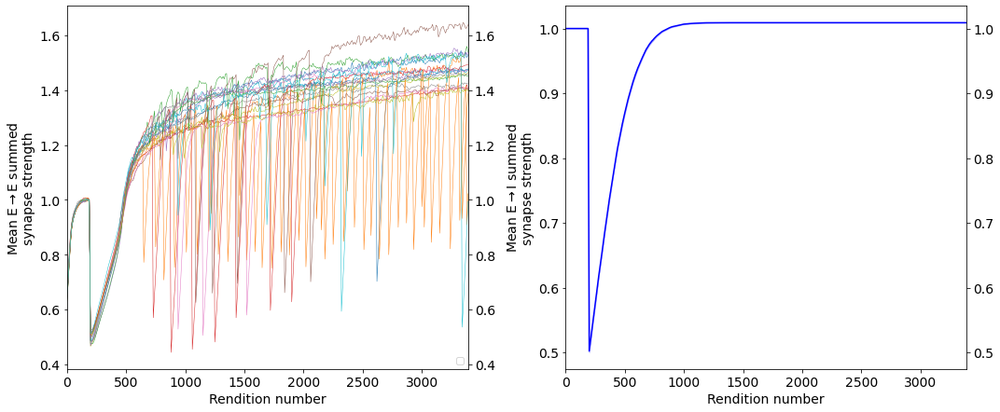

In [17]:
make_figure_2_plot([
    ['stdp_rand_syn_slow_7', 'CONDITION_all'],
], labels=[''] * 6, condition_colors=[('black', 'blue')] * 20,
timepoints=np.arange(0, 340), offsets=19 * np.ones(20), n_exc=450, new_cell_idx=300)

['stdp_rand_syn_slow_7', 'CONDITION_no_repl_2022']
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2006_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_2022-05-03--15:29--03:2415
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2007_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_2022-05-03--15:29--03:6435
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2004_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_2022-05-03--15:29--03:5876
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2000_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_2022-05-03--15:29--03:5704
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2001_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_2022-05-03--15:29--03:1671
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2008_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_2022-05-03--15:29--03:2681
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2002_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_2022-05-03--15:29--03:6544
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2009_W

No handles with labels found to put in legend.


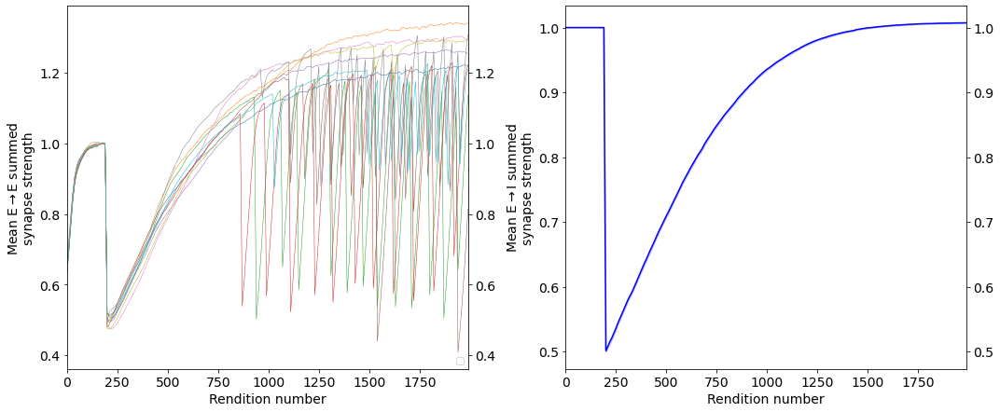

In [27]:
make_figure_2_plot([
    ['stdp_rand_syn_slow_7', 'CONDITION_no_repl_2022'],
], labels=[''] * 6, condition_colors=[('black', 'blue')] * 20,
timepoints=np.arange(0, 200), offsets=19 * np.ones(20), n_exc=300)

In [23]:
make_figure_2_plot([
    ['stdp_rand_syn_slow_6', 'CONDITION_all'],
], labels=[''] * 6, condition_colors=[('black', 'blue')] * 20,
timepoints=np.arange(0, 220), offsets=0 * np.ones(20), n_exc=450, new_cell_idx=300)

['stdp_rand_syn_slow_6', 'CONDITION_all']
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2000_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--02:51--06:5704
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2008_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--02:51--06:2681
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2010_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--03:06--55:0424
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2006_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--02:51--06:2415
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2002_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--02:51--06:6544
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2014_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--03:06--55:1855
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2004_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--02:51--06:5876
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2011_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7f4c5c3c8d30> (for post_execute):


KeyboardInterrupt: 

In [40]:
def make_timing_precision_graphs(names, timepoints=[600], n_exc=900, new_cell_idx=None):
    if new_cell_idx is None:
        n_exc = new_cell_idx
    
    all_dirs = []
    for name in names:
        if type(names) is list:
            all_dirs.append([dirs for dirs in filter_list_by_name_frags(all_in_dir('./robustness'), name)])
        else:
            all_dirs.append([dirs for dirs in filter_list_by_name_frags(all_in_dir('./robustness'), [name])])
    
    for i, exp_dir_names in enumerate(all_dirs):   
        for j, exp_dir_name in enumerate(exp_dir_names):
            print(exp_dir_name)
            scale = 1.1

            fig = plt.figure(constrained_layout=True, figsize=(5 * scale, 5 * scale))
            gs = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
            axs = [fig.add_subplot(gs[:, 0]), fig.add_subplot(gs[:, 0])]

            j = 0

            all_first_spk_times = []
            all_first_spk_times_new = []

            for i, load_data in load_exp_data(os.path.join('./robustness', exp_dir_name), n_exc=n_exc):
                if j < len(timepoints) and i == timepoints[j]:
                    data = load_data()
                    first_spk_times = data['first_spk_times']
                    original_surviving_mask = np.arange(n_exc) < int(2/3 * n_exc)        
                    if 'surviving_cell_mask' in data:
                        original_surviving_mask = np.logical_and(original_surviving_mask, data['surviving_cell_mask']).astype(bool)
                        
                    first_spk_times = data['first_spk_times'][original_surviving_mask]
                    all_first_spk_times.append(first_spk_times)
                    all_first_spk_times_new.append(first_spk_times[new_cell_idx:])
                    j += 1
            
            all_first_spk_times = np.stack(all_first_spk_times)
            all_nan_means = np.nanmean(all_first_spk_times, axis=0)
            all_nan_stds = np.nanstd(all_first_spk_times, axis=0)

            axs[0].scatter(all_nan_means, all_nan_stds, s=3., c='black', zorder=0, alpha=1)
            
            all_first_spk_times_new = np.stack(all_first_spk_times_new)
            all_nan_means_new = np.nanmean(all_first_spk_times_new, axis=0)
            all_nan_stds_new = np.nanstd(all_first_spk_times_new, axis=0)
            
            axs[0].scatter(all_nan_means_new, all_nan_stds_new, s=3., c='black', zorder=0, alpha=1)

            set_font_size(axs[0], 16)
            axs[0].spines['right'].set_visible(False)
            axs[0].spines['top'].set_visible(False)
            
            axs[0].set_xlabel('Firing time (s)')
            axs[0].set_ylabel('First spike STD (s)')
            
            axs[0].set_ylim(0, 0.005)

stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2016_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:8966
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2006_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:2415
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2010_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:0424
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2012_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:0713
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2015_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:7375
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2013_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:6753
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2000_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:5704
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2001_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:1671


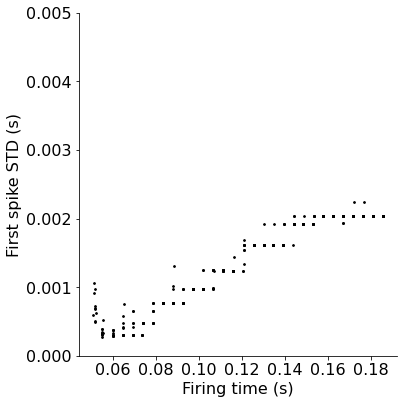

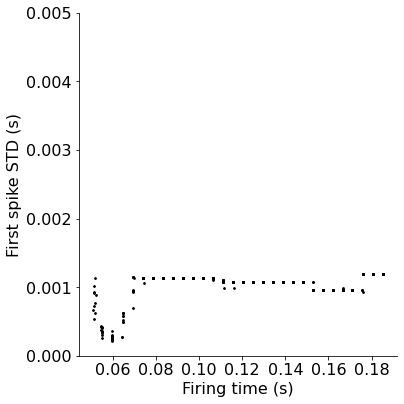

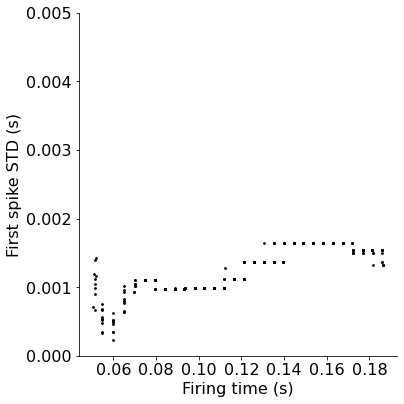

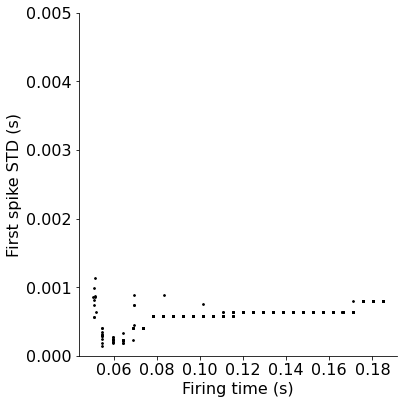

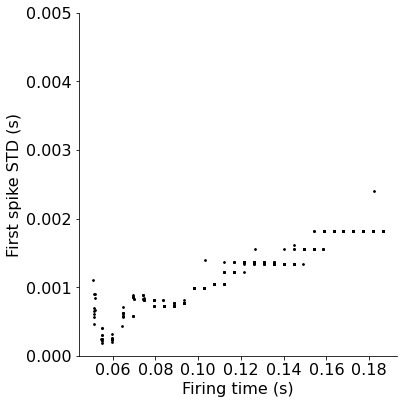

...

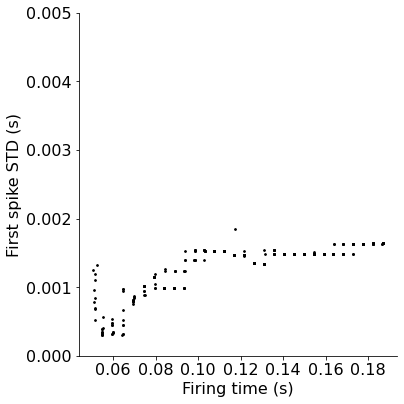

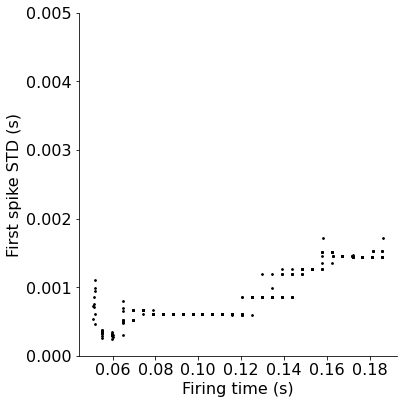

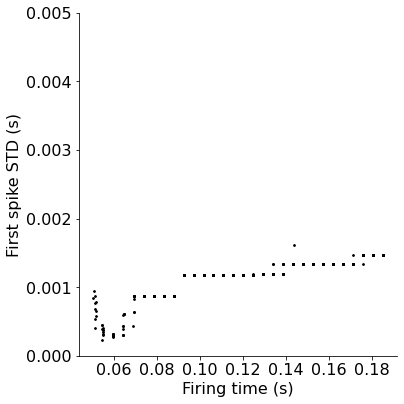

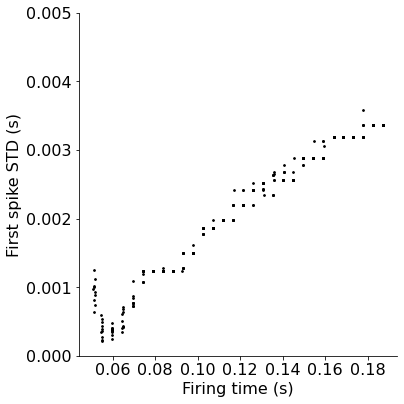

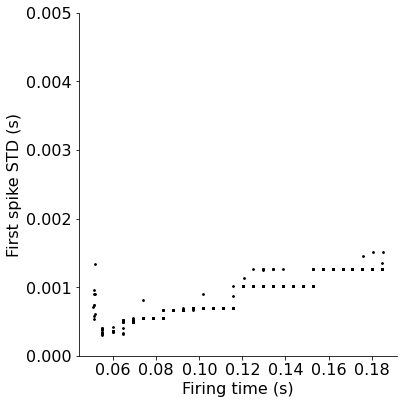

In [41]:
make_timing_precision_graphs([
    ['stdp_rand_syn_slow_7', 'CONDITION_all'],
],  np.arange(10, 19))

stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2016_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:8966
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2006_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:2415
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2010_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:0424
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2012_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:0713
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2015_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:7375
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2013_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:6753
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2000_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:5704
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2001_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:1671


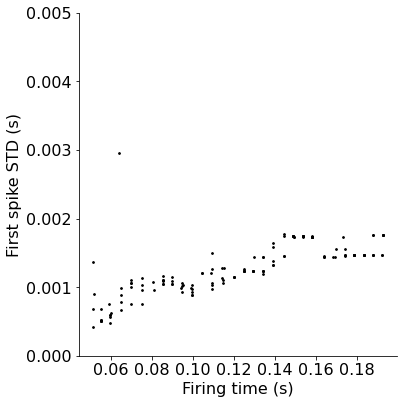

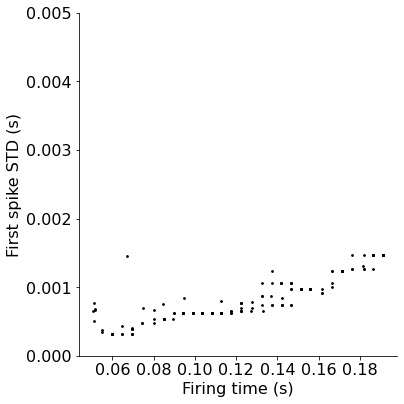

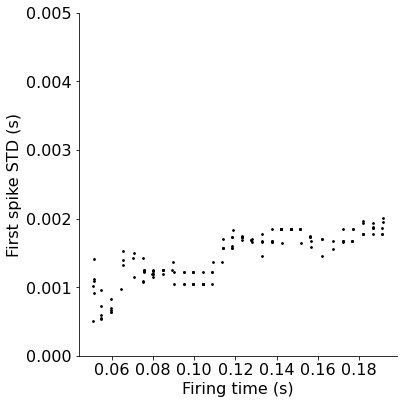

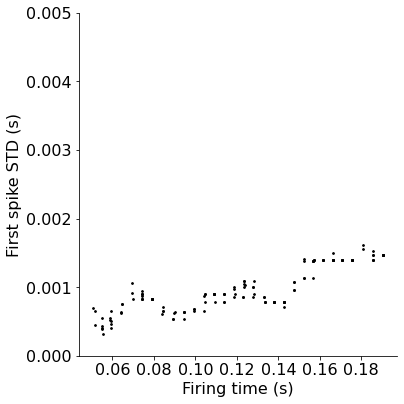

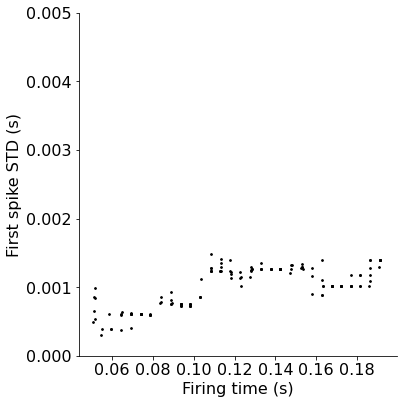

...

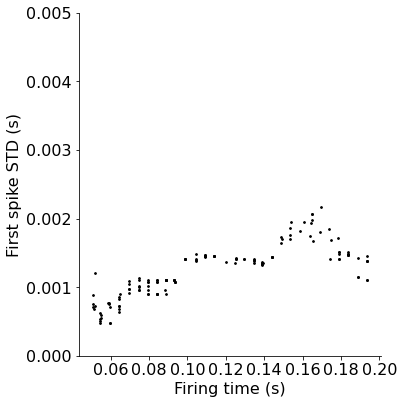

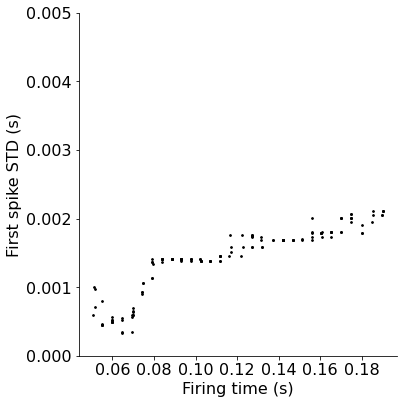

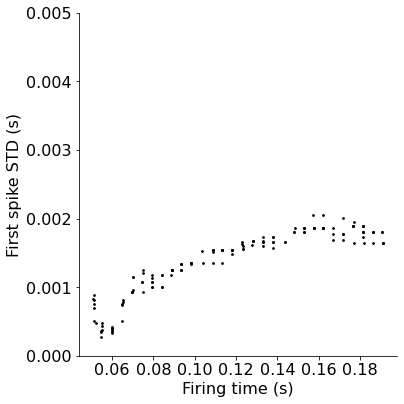

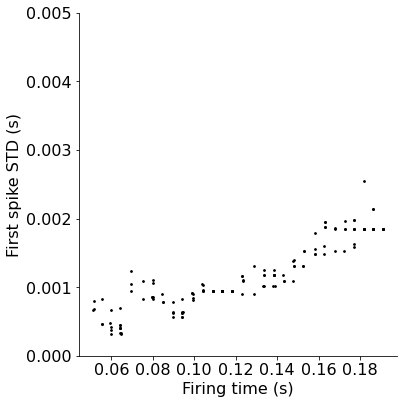

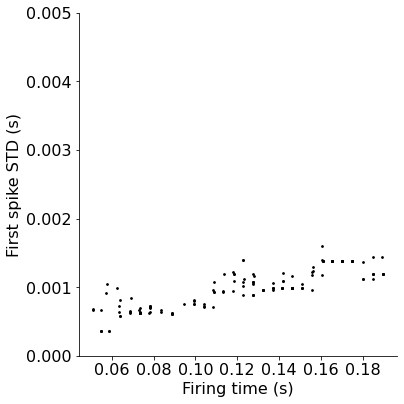

In [42]:
make_timing_precision_graphs([
    ['stdp_rand_syn_slow_7', 'CONDITION_all'],
],  np.arange(80, 90), n_exc=450)

In [67]:
def cummulative(arr):
    a = np.zeros(len(arr))
    for i in np.arange(len(arr)):
        a[i] = np.sum(arr[:i])
    return a

def extract_weight_dist_stats(names, timepoints, n_exc=450):
    all_dirs = []
    for name in names:
        if type(names) is list:
            all_dirs.append([dirs for dirs in filter_list_by_name_frags(all_in_dir('./robustness'), name)])
        else:
            all_dirs.append([dirs for dirs in filter_list_by_name_frags(all_in_dir('./robustness'), [name])])
    
    all_weight_dist_info = []
    all_summed_weights = []
    
    for i, exp_dir_names in enumerate(all_dirs):
        
        summed_weights_for_group = [[] for t in timepoints]
        summed_weights_for_group_perturbed = [[] for t in timepoints]
        weight_freqs_for_group = [[] for t in timepoints]
        weight_bins = [[] for t in timepoints]
        
        for j, exp_dir_name in enumerate(exp_dir_names):
            if j > 5:
                continue
            print(exp_dir_name)
            
            t_ctr = 0
            for k, data_load in load_exp_data(os.path.join('./robustness', exp_dir_name), name_frags=[], n_exc=n_exc):
                if k not in timepoints:
                    continue
                data = data_load()
                
                w_r_e = data['w_r_e'].todense()[:300, :450]
                
                graph_weight_matrix(w_r_e, '', v_max=0.26 * 0.004 * 1.3 * 0.5, cmap='gist_stern')
                
                bins = None
                freqs = []
                
                fig, ax = plt.subplots(1, 2, figsize=(8, 4), tight_layout=True)
                
                for r_idx in range(w_r_e.shape[0]):
                    row_weights = w_r_e[r_idx, :].T
                    r_bins, r_freqs = bin_occurrences(row_weights, max_val=0.000676 / 5, bin_size=0.00001)
                    bins = r_bins
                    freqs.append(r_freqs)
# #                     print(r_bins)
# #                     print(r_freqs)
#                     r_bins, r_freqs = bin_occurrences(w_r_e.reshape(300*300).T, max_val=0.000676, bin_size=0.0001)
                
                ax[0].plot(bins[1:], np.stack(freqs).mean(axis=0)[1:], lw=0.5, c='black')
                ax[1].plot(bins[1:], cummulative(np.stack(freqs).mean(axis=0)[1:]), lw=0.5, c='black')
                    
                ax[0].set_title('')
                ax[0].set_xlabel('Weight size')
                ax[0].set_ylabel('Counts')
                
                ax[1].set_title('')
                ax[1].set_xlabel('Weight size')
                ax[1].set_ylabel('Cumaltive counts (< weight size)')
                
                
#                 bins, freqs = bin_occurrences(summed_incoming_weights, max_val=0.0035, bin_size=0.00001)
#                 weight_bins[t_ctr] = bins
#                 weight_freqs_for_group[t_ctr].append(freqs)
                
                t_ctr += 1

stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2016_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:8966
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2006_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:29--00:2415
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2010_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:0424
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2012_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:0713
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2015_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:7375
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2013_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--13:40--25:6753


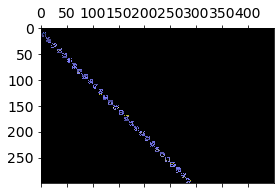

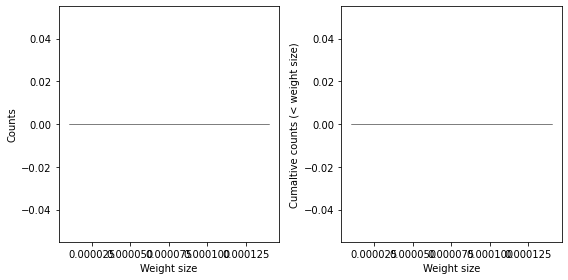

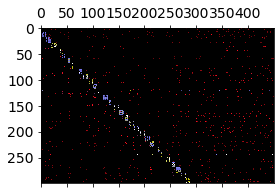

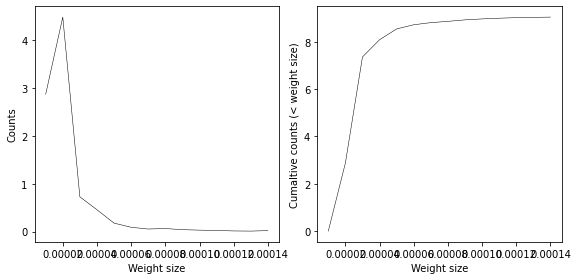

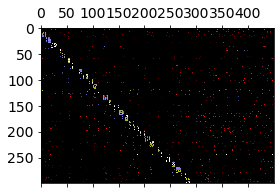

...

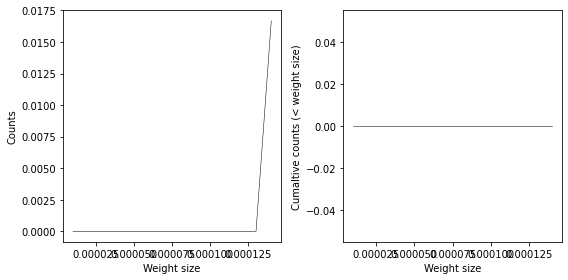

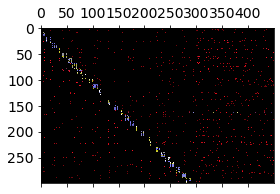

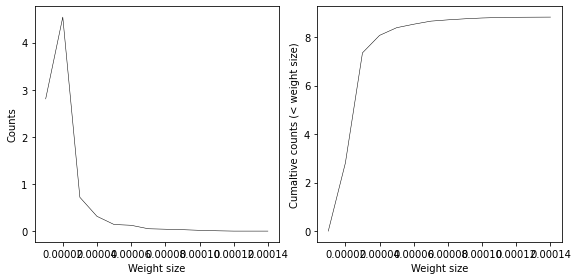

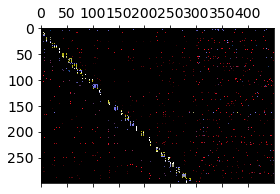

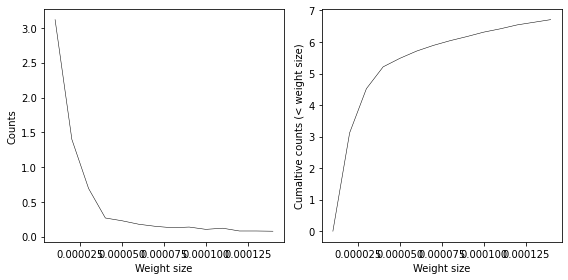

In [71]:
extract_weight_dist_stats([
    ['stdp_rand_syn_slow_7', 'CONDITION_all'],
],  [19, 50, 150])

stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2006_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_2022-05-03--15:29--03:2415
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2007_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_2022-05-03--15:29--03:6435
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2004_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_2022-05-03--15:29--03:5876
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2000_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_2022-05-03--15:29--03:5704
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2001_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_2022-05-03--15:29--03:1671
stdp_rand_syn_slow_7__DROP_SEV_0.5_SEED_2008_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_no_repl_2022-05-03--15:29--03:2681


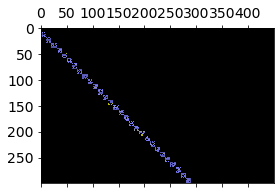

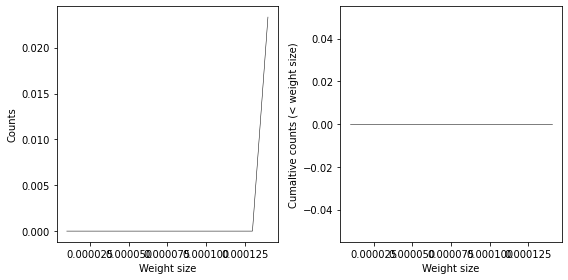

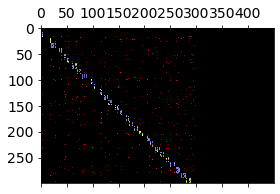

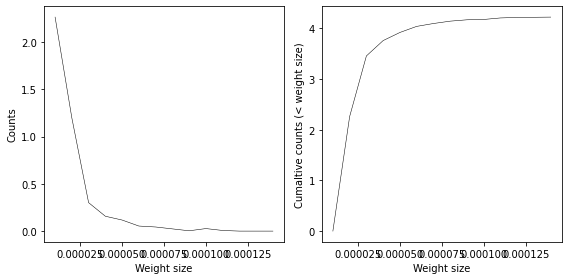

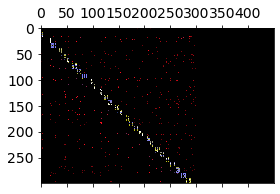

...

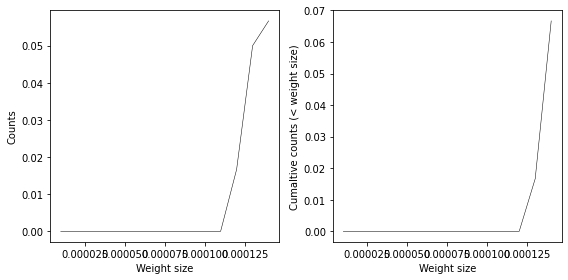

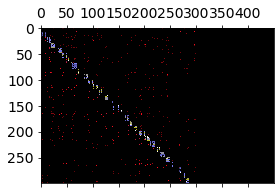

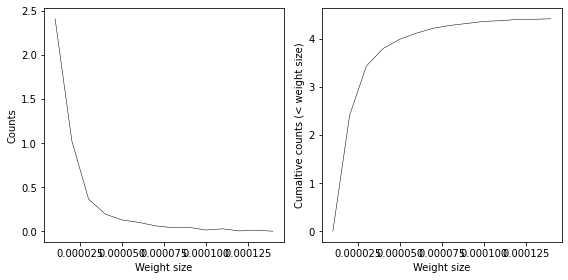

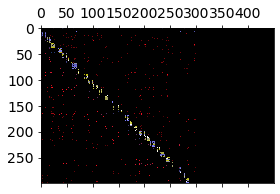

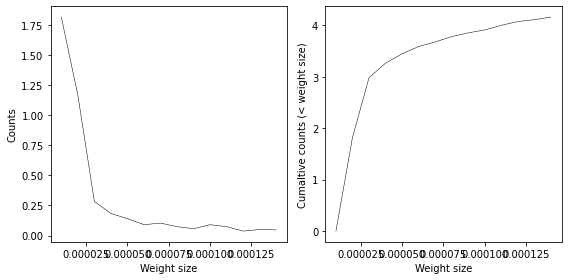

In [68]:
extract_weight_dist_stats([
    ['stdp_rand_syn_slow_7', 'CONDITION_no_repl_2022'],
],  [19, 50, 75], n_exc=300)

stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2000_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--02:51--06:5704
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2008_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--02:51--06:2681
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2010_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--03:06--55:0424
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2006_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--02:51--06:2415
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2002_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--02:51--06:6544
stdp_rand_syn_slow_6__DROP_SEV_0.5_SEED_2014_W_I_E_4.5e-05_W_E_I_5e-05_W_E_E_0.0018_CONDITION_all_2022-05-03--03:06--55:1855


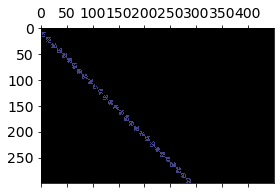

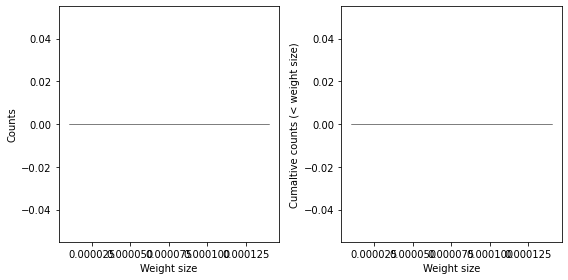

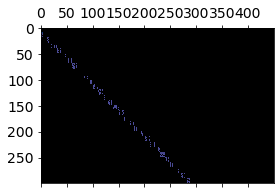

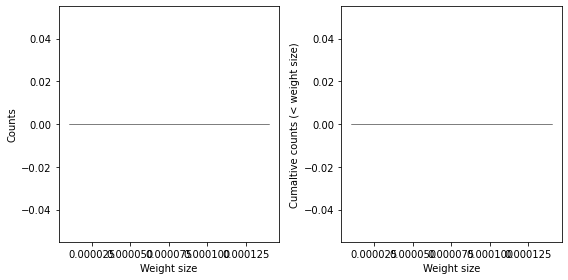

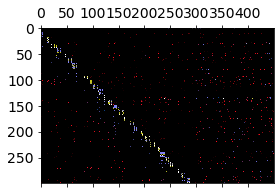

...

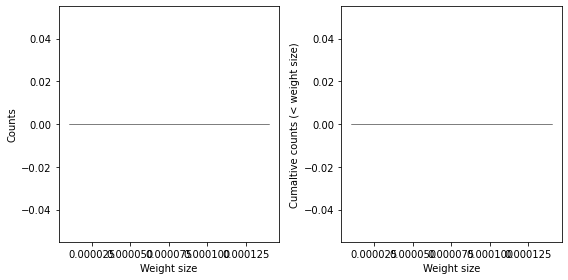

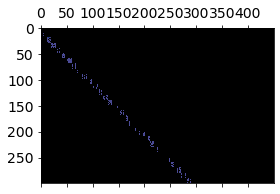

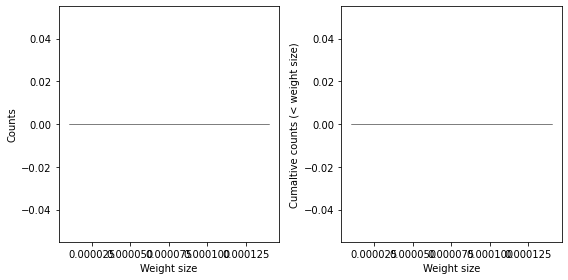

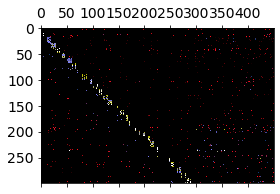

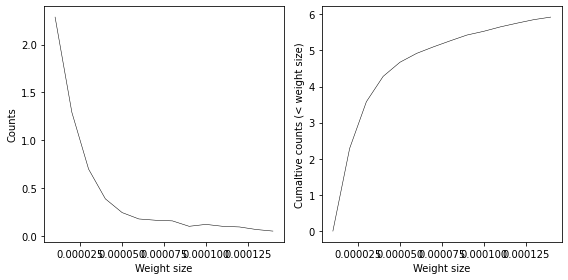

In [70]:
extract_weight_dist_stats([
    ['stdp_rand_syn_slow_6', 'CONDITION_all'],
],  [0, 1, 190])